In [1]:
import exifread

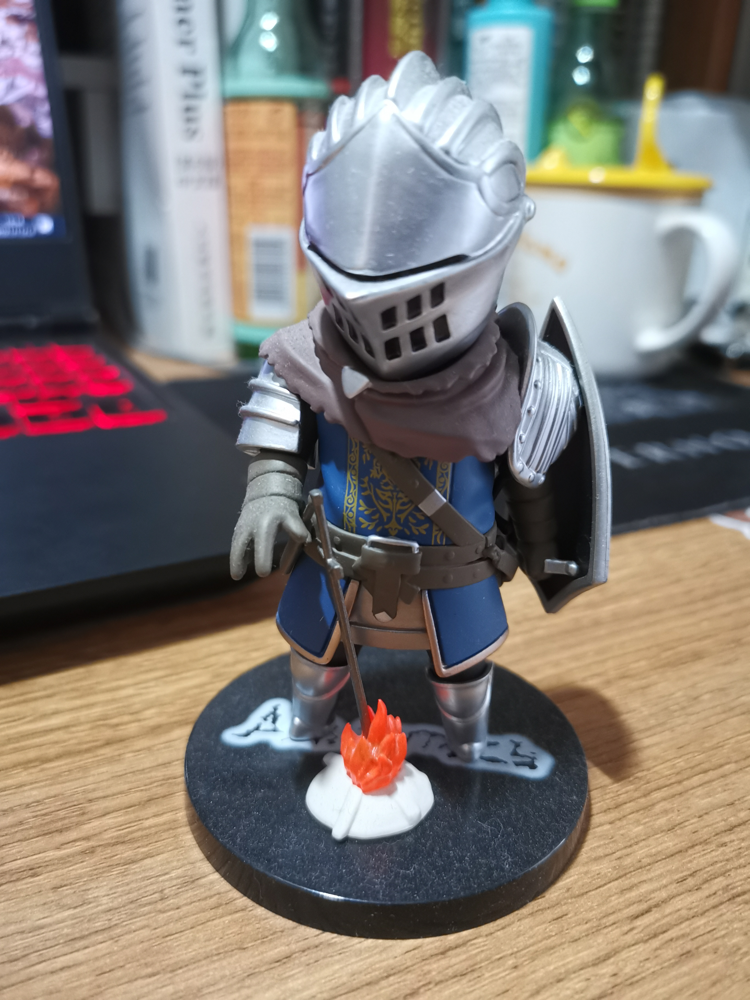

In [2]:
# 显示图片
from PIL import Image
im = Image.open('knight.jpg')
im

In [3]:
# 提取exif信息
f = open('knight.jpg', 'rb')
tags = exifread.process_file(f)
tags

{'Image ImageWidth': (0x0100) Short=2736 @ 18,
 'Image ImageLength': (0x0101) Short=3648 @ 30,
 'Image BitsPerSample': (0x0102) Short=[8, 8, 8] @ 262,
 'Image Make': (0x010F) ASCII=HUAWEI @ 194,
 'Image Model': (0x0110) ASCII=LYA-AL00 @ 202,
 'Image Orientation': (0x0112) Short=0 @ 78,
 'Image XResolution': (0x011A) Ratio=72 @ 212,
 'Image YResolution': (0x011B) Ratio=72 @ 220,
 'Image ResolutionUnit': (0x0128) Short=Pixels/Inch @ 114,
 'Image Software': (0x0131) ASCII=LYA-AL00L 2.0.0.209(C00E204R2P6) @ 228,
 'Image DateTime': (0x0132) ASCII=2021:11:14 13:14:59 @ 268,
 'Image YCbCrPositioning': (0x0213) Short=Centered @ 150,
 'Image ExifOffset': (0x8769) Long=288 @ 162,
 'GPS GPSVersionID': (0x0000) Byte=[2, 2, 0, 0] @ 1264,
 'GPS GPSLatitudeRef': (0x0001) ASCII=N @ 1276,
 'GPS GPSLatitude': (0x0002) Ratio=[24, 56, 33189239/1000000] @ 1404,
 'GPS GPSLongitudeRef': (0x0003) ASCII=E @ 1300,
 'GPS GPSLongitude': (0x0004) Ratio=[118, 38, 6638031/250000] @ 1380,
 'GPS GPSAltitudeRef': (0x00

In [4]:
# tags字典的键值
tags.keys()
for tag in tags.keys():
    if tag not in ('JPEGThumbnail', 'TIFFThumbnail', 'Filename', 'EXIF MakerNote'):
        print("%s,value %s" % (tag, tags[tag]))


Image ImageWidth,value 2736
Image ImageLength,value 3648
Image BitsPerSample,value [8, 8, 8]
Image Make,value HUAWEI
Image Model,value LYA-AL00
Image Orientation,value 0
Image XResolution,value 72
Image YResolution,value 72
Image ResolutionUnit,value Pixels/Inch
Image Software,value LYA-AL00L 2.0.0.209(C00E204R2P6)
Image DateTime,value 2021:11:14 13:14:59
Image YCbCrPositioning,value Centered
Image ExifOffset,value 288
GPS GPSVersionID,value [2, 2, 0, 0]
GPS GPSLatitudeRef,value N
GPS GPSLatitude,value [24, 56, 33189239/1000000]
GPS GPSLongitudeRef,value E
GPS GPSLongitude,value [118, 38, 6638031/250000]
GPS GPSAltitudeRef,value 1
GPS GPSAltitude,value 0
GPS GPSTimeStamp,value [5, 14, 57]
GPS GPSProcessingMethod,value CELLID
GPS GPSDate,value 2021:11:14
Image GPSInfo,value 1254
Image DeviceSettingDescription,value [105, 112, 112, 0]
Thumbnail ImageWidth,value 384
Thumbnail ImageLength,value 512
Thumbnail Compression,value JPEG (old-style)
Thumbnail Orientation,value 0
Thumbnail XResolu

In [5]:
# 经纬度信息
tags['GPS GPSLatitudeRef']
tags['GPS GPSLatitudeRef'].printable
tags['GPS GPSLongitudeRef']
tags['GPS GPSLongitudeRef'].printable
tags['GPS GPSLatitude']
tags['GPS GPSLatitude'].printable
tags['GPS GPSLongitude']
tags['GPS GPSLongitude'].printable

'[118, 38, 6638031/250000]'

In [6]:
# 经纬度处理
Latitude_list = tags['GPS GPSLatitude'].printable[1:-1].replace(', ', ',').split(',')
Latitude_list_new = [eval(each) for each in Latitude_list]
Longitude_list = tags['GPS GPSLongitude'].printable[1:-1].replace(', ', ',').split(',')
Longitude_list_new = [eval(each) for each in Longitude_list]

Latitude = str(Latitude_list_new[0])+ '°' + str(Latitude_list_new[1]) + '′'+ str(Latitude_list_new[2])+ '″'
if tags['GPS GPSLatitudeRef'].printable != 'N':
    Latitude = '-' + Latitude
Longtitude = str(Longitude_list_new[0])+ '°' + str(Longitude_list_new[1]) + '′'+ str(Longitude_list_new[2])+ '″'
if tags['GPS GPSLongitudeRef'].printable != 'E':
    Longitude = '-' + Longitude
    
GPS = Latitude + ',' + Longtitude
print(GPS)

24°56′33.189239″,118°38′26.552124″


In [9]:
# 经纬度的小数表示
tags['GPS GPSLatitude'].printable
Latitude_list = tags['GPS GPSLatitude'].printable[1:-1].replace(', ', ',').split(',')
Latitude = eval(Latitude_list[0]) +eval(Latitude_list[1])/60 + eval(Latitude_list[2])/3600
Longitude_list = tags['GPS GPSLongitude'].printable[1:-1].replace(', ', ',').split(',')
Longitude = eval(Longitude_list[0]) +eval(Longitude_list[1])/60 + eval(Longitude_list[2])/3600
print(str(Latitude) + ',' + str(Longitude))

24.94255256638889,118.64070892333334


In [11]:
print('拍摄时间', tags['EXIF DateTimeOriginal'])
print('照相机型号', tags['Image Model'])
print('照片尺寸', tags['EXIF ExifImageWidth'], tags['EXIF ExifImageLength'])

拍摄时间 2021:11:14 13:14:59
照相机型号 LYA-AL00
照片尺寸 2736 3648


In [13]:
import folium
from folium import Marker

In [ ]:
folium.Icon?

In [17]:
location_center = [24.94255256638889,118.64070892333334]
location_center_temp = [24.94255256638889,118.64070892333334]
m_1 = folium.Map(location = location_center_temp, titles = 'openstreetmap', zoom_start = 15, attr = '深海浇花', control_scale = True)

# 增加拾取经纬度控件
m_1.add_child(folium.LatLngPopup())

# 在地图上标记
folium.Marker(
    location = location_center,
    popup = '拍照地点',
    icon = folium.Icon(color = 'blue', icon = 'fa-camera', prefix = 'fa')# 标记logo
).add_to(m_1)

#在地图上添加另一个标记

#将地图导出为html
m_1.save('传火祭祀场.html')

#展示地图
m_1